# Chapter 9 - Comparing binomial rates

In [1]:
using Pkg
using Logging
using DynamicPPL, Turing
using Zygote, ReverseDiff
using StatsPlots, Random
using LaTeXStrings
using CSV
using DataFrames
using SpecialFunctions
using LinearAlgebra
using FillArrays
using CSV, DataFrames
using LogExpFunctions
using KernelDensity
using Interpolations
using Statistics
using StatsBase
using Dierckx

In [2]:
format=:png

:png

In [3]:
Random.seed!(9)

TaskLocalRNG()

## 9.1 Equality of proportions


$$ s_{1} \sim \text{Binomial}(\theta_{1},n_{1})$$
$$ s_{2} \sim \text{Binomial}(\theta_{2},n_{2})$$
$$ \theta_{1} \sim \text{Beta}(1,1) $$
$$ \theta_{2} \sim \text{Beta}(1,1) $$
$$ \delta = \theta_{1} -\theta_{2}$$ 

In [4]:
s1 = 424
s2 = 5416
n1 = 777
n2 = 9072

@model function EqualityOfProportions(s1, n1, s2, n2)
    theta1 ~ Beta(1, 1)
    theta2 ~ Beta(1, 1)

    s1 ~ Binomial(n1, theta1)
    s2 ~ Binomial(n2, theta2)
end

iterations = 5_000
burnin = 1_000

model_equality_of_proportions = EqualityOfProportions(s1, n1, s2, n2)
chain = sample(model_equality_of_proportions, NUTS(), iterations, burnin=burnin)

┌ Info: Found initial step size
└   ϵ = 0.025
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:00


Chains MCMC chain (5000×14×1 Array{Float64, 3}):

Iterations        = 1001:1:6000
Number of chains  = 1
Samples per chain = 5000
Wall duration     = 8.34 seconds
Compute duration  = 8.34 seconds
parameters        = theta1, theta2
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

      theta1    0.5457    0.0177    0.0003   4760.9049   3267.6844    1.0003   ⋯
      theta2    0.5970    0.0051    0.0001   5112.7350   3402.6623    0.9999   ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 



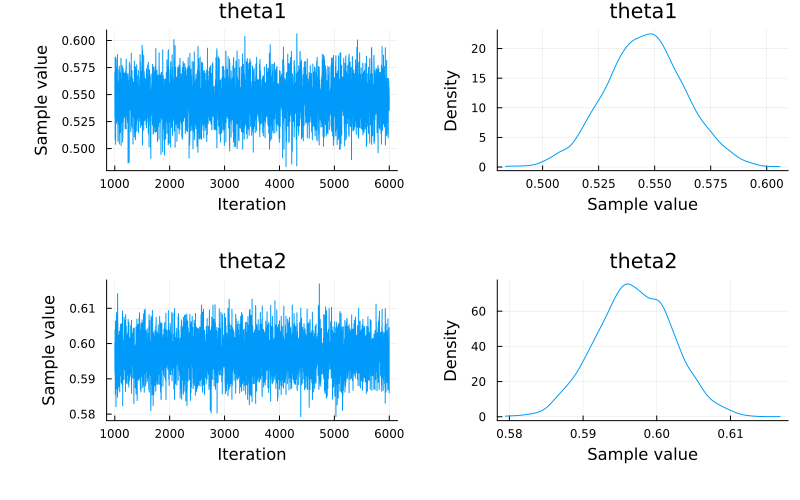

In [5]:
plot(chain, size=(800, 500),
    left_margin=10Plots.mm, bottom_margin=10Plots.mm, fmt=format)

In [6]:
function plot_equality_of_proportions(chain, prior_dist, zoom, size=(600, 400))
    delta = (chain[:theta1] .- chain[:theta2]) |> vec
    plot(zoom, [pdf(prior_dist, e) for e in zoom], size=size, fmt=format, linewidth=2, label="Prior")
    k = kde(delta)
    plot!(zoom, pdf(k, zoom), linewidth=2, ls=:dash, label="Posterior")
    plot!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], linewidth=2, label=false)
    scatter!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], label=false)
    bayes_factor = pdf(k, 0) / pdf(prior_dist, 0)
    println("Bayes Factor $bayes_factor")
    xlabel!("Delta")
    ylabel!("Density")
    xlims!(min(zoom...), max(zoom...))
end

plot_equality_of_proportions (generic function with 2 methods)

Bayes Factor 0.3584135097709259
Bayes Factor 0.3584135097709259


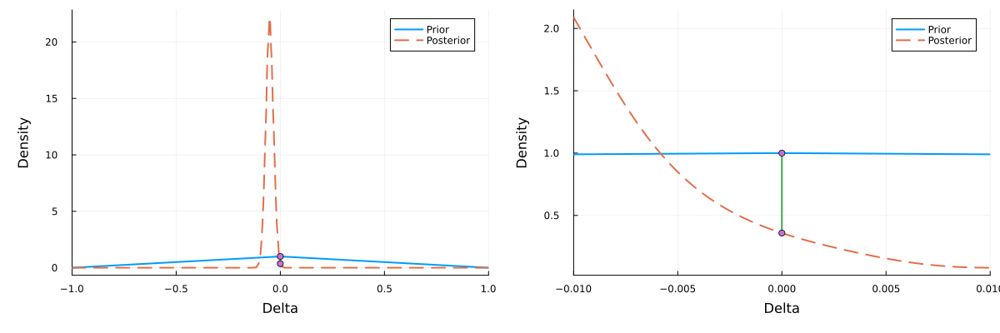

In [7]:
plot(
    plot_equality_of_proportions(chain, TriangularDist(-1, 1, 0), -1:0.001:1),
    plot_equality_of_proportions(chain, TriangularDist(-1, 1, 0), -0.01:0.0001:0.01),
    size=(1200, 400), left_margin=10Plots.mm, bottom_margin=10Plots.mm, fmt=format
)

## 9.2 Order-restricted equality of proportions


$$ s_{1} \sim \text{Binomial}(\theta_{1},n_{1})$$
$$ s_{2} \sim \text{Binomial}(\theta_{2},n_{2})$$
$$ (\theta_{1},\theta_{2}) \sim \text{Uniform}(0,1)^2, \theta_{2} \gt \theta_{1}$$
$$ \delta = \theta_{1} -\theta_{2}$$ 

In [8]:
s1 = 424
s2 = 5416
n1 = 777
n2 = 9072

phi(x) = cdf(Normal(0, 1), x)

function normcdf1(thetap1, thetap2)
    angle = 45 * Float64(pi) / 180
    return phi((cos(angle) * thetap1) - (sin(angle) * abs(thetap2)))
end


function normcdf2(thetap1, thetap2)
    angle = 45 * Float64(pi) / 180
    return phi((sin(angle) * thetap1) + (cos(angle) * abs(thetap2)))
end

@model function OrderRestrictedEqualityOfProportions()
    theta2a ~ Uniform(0, 1)
    theta1a ~ Uniform(0, theta2a)

    deltaa = theta1a - theta2a
    thetap ~ MvNormal([0, 0], [1, 1])
    theta1e = normcdf1(thetap[1], thetap[2])
    theta2e = normcdf2(thetap[1], thetap[2])

    deltae = theta1e - theta2e
    return (deltaa=deltaa, deltae=deltae, theta1e=theta1e, theta2e=theta2e)
end

iterations = 30_000

model_order_restricted_equality_of_proportions = OrderRestrictedEqualityOfProportions()
chain = sample(model_order_restricted_equality_of_proportions, SMC(), iterations)
chains_params = Turing.MCMCChains.get_sections(chain, :parameters)
quantities = generated_quantities(model_order_restricted_equality_of_proportions, chains_params)
chain

Sampling: 100%|█████████████████████████████████████████| Time: 0:00:01


Chains MCMC chain (30000×6×1 Array{Float64, 3}):

Log evidence      = 0.0
Iterations        = 1:1:30000
Number of chains  = 1
Samples per chain = 30000
Wall duration     = 43.98 seconds
Compute duration  = 43.98 seconds
parameters        = theta2a, theta1a, thetap[1], thetap[2]
internals         = lp, weight

Summary Statistics
  parameters      mean       std      mcse     ess_bulk     ess_tail      rhat ⋯
      Symbol   Float64   Float64   Float64      Float64      Float64   Float64 ⋯

     theta2a    0.4995    0.2877    0.0017   29819.6834   29409.0199    1.0000 ⋯
     theta1a    0.2493    0.2208    0.0013   29429.5913   29059.7470    1.0001 ⋯
   thetap[1]    0.0054    0.9919    0.0058   29523.0793   29504.0565    1.0002 ⋯
   thetap[2]    0.0031    1.0001    0.0058   29401.8339   28564.3645    1.0001 ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Fl

In [9]:
# theta1 = chain[:theta1a] |> vec |> collect
# theta2 = chain[:theta2a] |> vec |> collect;

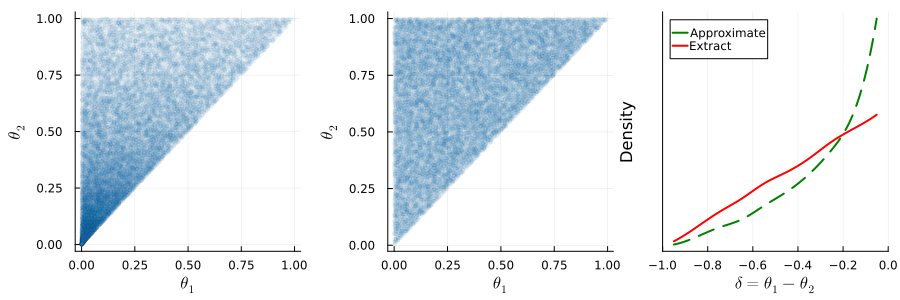

In [10]:
alpha = 0.03
theta1e = map(x -> x[:theta1e], quantities)
theta2e = map(x -> x[:theta2e], quantities);
deltaa = map(x -> x[:deltaa], quantities);
deltae = map(x -> x[:deltae], quantities);

p1 = scatter(chain[:theta1a], chain[:theta2a], 
    markersize=2, alpha=alpha, size=(300,300), legend=false)
xlabel!(L"\theta_1")
ylabel!(L"\theta_2")

p2 = scatter(theta1e, theta2e, 
    markersize=2, alpha=alpha, size=(300,300), legend=false)
xlabel!(L"\theta_1")
ylabel!(L"\theta_2")

bins = 15
h = fit(Histogram, deltaa |> vec, nbins=bins)
x_range = h.edges[1] |> collect
cen_x = [(x_range[i] + x_range[i+1])/2 for i in 1:(length(x_range)-1)]
cen_y = h.weights
spl = Spline1D(cen_x, cen_y; s=length(cen_x))
xq = minimum(cen_x):0.001:maximum(cen_x)

p3 = plot(xq, spl(xq), label="Approximate", size=(300,300), 
    color="green", linewidth=2, ls=:dash, yticks=false)

h = fit(Histogram, deltae |> vec, nbins=bins)
x_range = h.edges[1] |> collect
cen_x = [(x_range[i] + x_range[i+1])/2 for i in 1:(length(x_range)-1)]
cen_y = h.weights
spl = Spline1D(cen_x, cen_y; s=length(cen_x))
xq = minimum(cen_x):0.001:maximum(cen_x)
plot!(xq, spl(xq), label="Extract", color="red", linewidth=2)
xlims!(-1, 0)
xlabel!(L"\delta = \theta_1 - \theta_2")
ylabel!("Density")

plot(p1, p2, p3,
    size=(900, 300),
    fmt=format, layout=(1,3),bottom_margin=5Plots.mm, left_margin=5Plots.mm
)

In [11]:
s1 = 424
s2 = 5416
n1 = 777
n2 = 9072

phi(x) = cdf(Normal(0, 1), x)

function normcdf1(thetap1, thetap2)
    angle = 45 * Float64(pi) / 180
    return phi((cos(angle) * thetap1) - (sin(angle) * abs(thetap2)))
end


function normcdf2(thetap1, thetap2)
    angle = 45 * Float64(pi) / 180
    return phi((sin(angle) * thetap1) + (cos(angle) * abs(thetap2)))
end

@model function OrderRestrictedEqualityOfProportions(s1, n1, s2, n2)
    thetap ~ MvNormal([0, 0], [1, 1])
    theta1e = normcdf1(thetap[1], thetap[2])
    theta2e = normcdf2(thetap[1], thetap[2])

    deltae = theta1e - theta2e

    s1 ~ Binomial(n1, theta1e)
    s2 ~ Binomial(n2, theta2e)

    return (deltae=deltae, theta1e=theta1e, theta2e=theta2e)
end

iterations = 5_000
burnin = 2_500

model_order_restricted_equality_of_proportions = OrderRestrictedEqualityOfProportions(s1, n1, s2, n2)
chain = sample(model_order_restricted_equality_of_proportions, NUTS(), iterations, burnin=burnin)
chains_params = Turing.MCMCChains.get_sections(chain, :parameters)
quantities = generated_quantities(model_order_restricted_equality_of_proportions, chains_params)
chain

┌ Info: Found initial step size
└   ϵ = 0.00625
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:00


Chains MCMC chain (5000×14×1 Array{Float64, 3}):

Iterations        = 1001:1:6000
Number of chains  = 1
Samples per chain = 5000
Wall duration     = 2.52 seconds
Compute duration  = 2.52 seconds
parameters        = thetap[1], thetap[2]
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

   thetap[1]    0.2547    0.0341    0.0009   1330.4698   1648.0405    1.0003   ⋯
   thetap[2]   -0.0062    0.0986    0.0216     28.2434    468.4895    1.0375   ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Floa

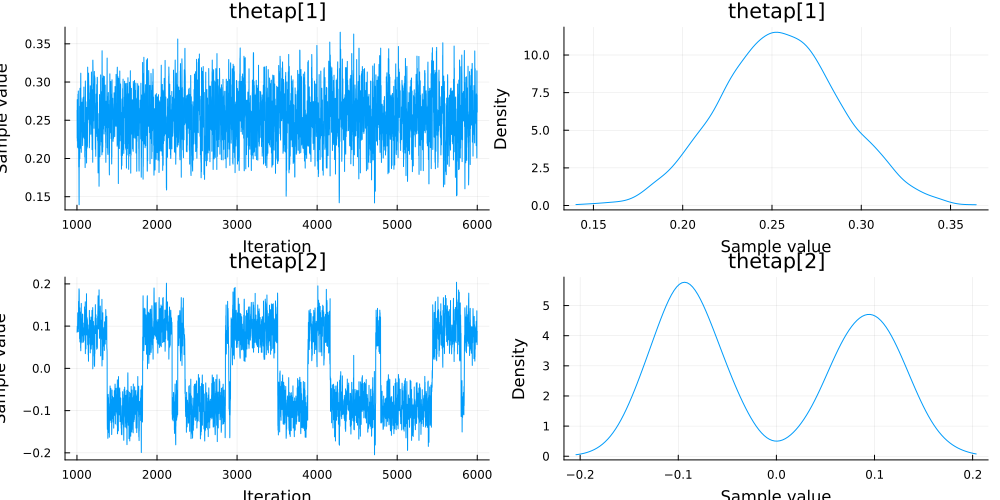

In [12]:
plot(chain, fmt=format)

In [13]:
function plot_order_restricted_equality_of_proportions(quantities, prior_dist, zoom, size=(600, 400))
    delta = map(x -> x[:deltae], quantities) |> collect |> vec
    plot(zoom, [pdf(prior_dist, e) for e in zoom], size=size, fmt=format, linewidth=2, label="Prior")
    k = kde(delta)
    plot!(zoom, pdf(k, zoom), linewidth=2, ls=:dash, label="Posterior")
    plot!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], linewidth=2, label=false)
    scatter!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], label=false)
    bayes_factor = pdf(k, 0) / pdf(prior_dist, 0)
    println("Bayes Factor $bayes_factor")
    xlabel!("Delta")
    ylabel!("Density")
    xlims!(min(zoom...), max(zoom...))
end

plot_order_restricted_equality_of_proportions (generic function with 2 methods)

Bayes Factor 0.19015084480044653
Bayes Factor 0.19015084480044653


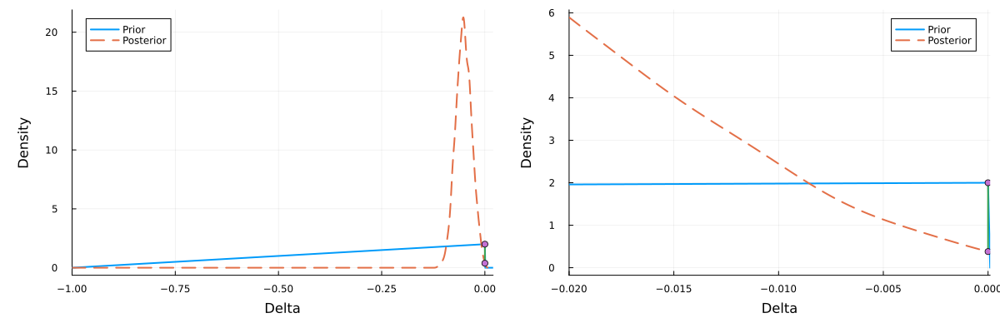

In [14]:
plot(
    plot_order_restricted_equality_of_proportions(quantities,TriangularDist(-1, 0, 0), -1:0.001:0.02),
    plot_order_restricted_equality_of_proportions(quantities,TriangularDist(-1, 0, 0), -0.02:0.0001:0.0001),
    size=(1200, 400), left_margin=10Plots.mm, bottom_margin=10Plots.mm, fmt=format
)

In [15]:
delta = map(x -> x[:deltae], quantities) |> collect |> vec
k = kde(delta)
bayes_factor_2 = pdf(k, 0) / pdf(TriangularDist(-1, 0, 0), 0)

0.19015084480044653

## 9.3 Comparing within-subject proportions


$$ \mu \sim \text{Gaussian}(0,1)_{\mathcal I(0,∞)}$$
$$ \sigma \sim \text{Uniform}(0,10)$$
$$ \delta \sim \text{Gaussian}(0,1)_{\mathcal I(0,∞)}$$
$$ \sigma_{\alpha} \sim \text{Uniform}(0,10)$$
$$ \mu_{\alpha} = \delta\sigma_{\alpha}$$
$$ \alpha_{i} \sim \text{Gaussian}(\mu_{\alpha},1/\sigma^2_{\alpha})$$
$$ \phi^n_{i} \sim \text{Gaussian}(\mu,1/\sigma^2)$$
  
$$ \phi^b_{i} = \phi^n_{i}+\alpha_{i}$$
$$ \theta^n_{i} = \Phi(\phi^n_{i})$$
$$ \theta^b_{i} = \Phi(\phi^b_{i})$$
  
$$ s^n_{i} \sim \text{Binomial}(\theta^n_{i},n^n)$$
$$ s^b_{i} \sim \text{Binomial}(\theta^b_{i},n^b)$$

In [16]:
# fmt: off
### Zeelenberg data:
# Study Both:
sb = [
    15, 11, 15, 14, 15, 18, 16, 16, 18, 16, 15, 13, 18, 12, 11, 13, 17, 18, 16, 11, 17, 18,
    12, 18, 18, 14, 21, 18, 17, 10, 11, 12, 16, 18, 17, 15, 19, 12, 21, 15, 16, 20, 15, 19,
    16, 16, 14, 18, 16, 19, 17, 11, 19, 18, 16, 16, 11, 19, 18, 12, 15, 18, 20, 8, 12, 19,
    16, 16, 16, 12, 18, 17, 11, 20
]
nb = 21

# Study Neither:
sn = [
    15, 12, 14, 15, 13, 14, 10, 17, 13, 16, 16, 10, 15, 15, 10, 14, 17, 18, 19, 12, 19, 18,
    10, 18, 16, 13, 15, 20, 13, 15, 13, 14, 19, 19, 19, 18, 13, 12, 19, 16, 14, 17, 15, 16,
    15, 16, 13, 15, 14, 19, 12, 11, 17, 13, 18, 13, 13, 19, 18, 13, 13, 16, 18, 14, 14, 17,
    12, 12, 16, 14, 16, 18, 13, 13
]

nn = 21
ns = length(sb)

74

In [17]:
phi(x) = cdf(Normal(0, 1), x)

@model function ComparingWithinSubjectProportions(sb, sn)
    mu ~ truncated(Normal(0, 1), lower=0)
    sigma ~ Uniform(0, 10)
    delta ~ truncated(Normal(0, 1), lower=0)

    sigma_alpha ~ Uniform(0, 10)
    mu_alpha = delta * sigma_alpha

    alpha_n ~ filldist(Normal(mu_alpha, sigma_alpha), length(sb))
    phi_n ~ filldist(Normal(mu, sigma), length(sb))

    phi_b = phi_n + alpha_n

    theta_n = phi.(phi_n)
    theta_b = phi.(phi_b)

    for i in eachindex(sb)
        sb[i] ~ Binomial(nb, theta_b[i])
        sn[i] ~ Binomial(nn, theta_n[i])
    end
    return (theta_n=theta_n, theta_b=theta_b)
end

iterations = 10_000
burnin = 5_000

model_comparing_within_subject_proportions = ComparingWithinSubjectProportions(sb, sn)
chain = sample(model_comparing_within_subject_proportions, NUTS(), iterations, burnin=burnin)
chains_params = Turing.MCMCChains.get_sections(chain, :parameters)
quantities = generated_quantities(model_comparing_within_subject_proportions, chains_params)
chain

┌ Warning: failed to find valid initial parameters in 10 tries; consider providing explicit initial parameters using the `init_params` keyword
└ @ Turing.Inference ~/.julia/packages/Turing/FSBW7/src/inference/hmc.jl:172
┌ Info: Found initial step size
└   ϵ = 0.4
Sampling: 100%|█████████████████████████████████████████| Time: 0:01:49


Chains MCMC chain (10000×164×1 Array{Float64, 3}):

Iterations        = 1001:1:11000
Number of chains  = 1
Samples per chain = 10000
Wall duration     = 117.99 seconds
Compute duration  = 117.99 seconds
parameters        = mu, sigma, delta, sigma_alpha, alpha_n[1], alpha_n[2], alpha_n[3], alpha_n[4], alpha_n[5], alpha_n[6], alpha_n[7], alpha_n[8], alpha_n[9], alpha_n[10], alpha_n[11], alpha_n[12], alpha_n[13], alpha_n[14], alpha_n[15], alpha_n[16], alpha_n[17], alpha_n[18], alpha_n[19], alpha_n[20], alpha_n[21], alpha_n[22], alpha_n[23], alpha_n[24], alpha_n[25], alpha_n[26], alpha_n[27], alpha_n[28], alpha_n[29], alpha_n[30], alpha_n[31], alpha_n[32], alpha_n[33], alpha_n[34], alpha_n[35], alpha_n[36], alpha_n[37], alpha_n[38], alpha_n[39], alpha_n[40], alpha_n[41], alpha_n[42], alpha_n[43], alpha_n[44], alpha_n[45], alpha_n[46], alpha_n[47], alpha_n[48], alpha_n[49], alpha_n[50], alpha_n[51], alpha_n[52], alpha_n[53], alpha_n[54], alpha_n[55], alpha_n[56], alpha_n[57], alpha_n[58], a

In [18]:
function plot_comparing_within_subject_proportions(chain, prior_dist, zoom, size=(600, 400))
    delta = chain[:delta] |> vec
    plot(zoom, [pdf(prior_dist, e) for e in zoom],
        size=size, fmt=format, linewidth=2, label="Prior")
    k = kde(delta)
    plot!(zoom, pdf(k, zoom), linewidth=2, ls=:dash, label="Posterior")
    plot!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], linewidth=2, label=false)
    scatter!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], label=false)
    bayes_factor = pdf(k, 0) / pdf(prior_dist, 0)
    println("Bayes Factor $bayes_factor")
    xlims!(min(zoom...), max(zoom...))
end

plot_comparing_within_subject_proportions (generic function with 2 methods)

Bayes Factor 0.20233647781390138


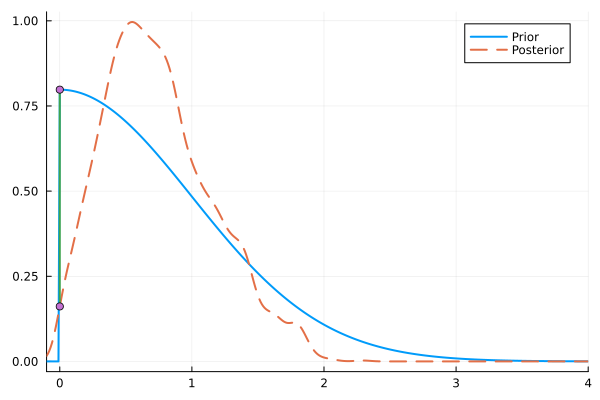

In [19]:
plot_comparing_within_subject_proportions(chain,
    truncated(Normal(0, 1), lower=0), -0.1:0.01:4)

## 9.4 Comparing between-subject proportions


$$ \delta \sim \text{Gaussian}(0,1)$$
$$ \mu \sim \text{Gaussian}(0,1)$$
$$ \sigma \sim \text{Uniform}(0,10)$$
$$ \alpha = \delta\sigma$$
  
$$ \phi^c_{i} \sim \text{Gaussian}(\mu\,+\alpha/2,1/\sigma^2)$$
$$ \phi^a_{j} \sim \text{Gaussian}(\mu\,-\alpha/2,1/\sigma^2)$$
  
$$ \theta^c_{i} = \Phi(\phi^c_{i})$$
$$ \theta^a_{j} = \Phi(\phi^a_{j})$$
  
$$ s^c_{i} \sim \text{Binomial}(\theta^c_{i},n^c_{i})$$
$$ s^a_{j} \sim \text{Binomial}(\theta^a_{j},n^a_{j})$$

In [20]:
# fmt: off
### Geurts data:
# Normal Controls:
numerrors1 = [
    15, 10, 61, 11, 60, 44, 63, 70, 57, 11, 67, 21, 89, 12, 63, 11, 96, 10, 37, 19, 44,
    18, 78, 27, 60, 14
]
nc = [
    89, 74, 128, 87, 128, 121, 128, 128, 128, 78, 128, 106, 128, 83, 128, 100, 128,
    73, 128, 86, 128, 86, 128, 100, 128, 79
]

kc = nc - numerrors1
nsc = length(kc)
# ADHD:
numerrors2 = [
    88, 50, 58, 17, 40, 18, 21, 50, 21, 69, 19, 29, 11, 76, 46, 36, 37, 72, 27, 92, 13,
    39, 53, 31, 49, 57, 17, 10, 12, 21, 39, 43, 49, 17, 39, 13, 68, 24, 21, 27, 48, 54,
    41, 75, 38, 76, 21, 41, 61, 24, 28, 21
]
na = [
    128, 128, 128, 86, 128, 117, 89, 128, 110, 128, 93, 107, 87, 128, 128, 113, 128,
    128, 98, 128, 93, 116, 128, 116, 128, 128, 93, 86, 86, 96, 128, 128, 128, 86, 128,
    78, 128, 111, 100, 95, 128, 128, 128, 128, 128, 128, 98, 127, 128, 93, 110, 96
]
ka = na - numerrors2
nsa = length(ka)

52

In [21]:
phi(x) = cdf(Normal(0, 1), x)

@model function ComparingBetweenSubjectProportions(ka, na, kc, nc)
    mu ~ Normal(0, 1)
    sigma ~ Uniform(0, 10)
    delta ~ Normal(0, 1)

    alpha = delta * sigma

    phi_c ~ filldist(Normal(mu + alpha / 2, sigma), length(kc))
    phi_a ~ filldist(Normal(mu - alpha / 2, sigma), length(ka))

    theta_c = phi.(phi_c)
    theta_a = phi.(phi_a)

    for i in eachindex(kc)
        kc[i] ~ Binomial(nc[i], theta_c[i])
    end

    for i in eachindex(ka)
        ka[i] ~ Binomial(na[i], theta_a[i])
    end

    return (theta_c=theta_c, theta_a=theta_a)
end


iterations = 10_000
burnin = 5_000

model_comparing_between_subject_proportions = ComparingBetweenSubjectProportions(ka, na, kc, nc)
chain = sample(model_comparing_between_subject_proportions, NUTS(), iterations, burnin=burnin)
chains_params = Turing.MCMCChains.get_sections(chain, :parameters)
quantities = generated_quantities(model_comparing_between_subject_proportions, chains_params)
chain

┌ Info: Found initial step size
└   ϵ = 0.4
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:17


Chains MCMC chain (10000×93×1 Array{Float64, 3}):

Iterations        = 1001:1:11000
Number of chains  = 1
Samples per chain = 10000
Wall duration     = 24.1 seconds
Compute duration  = 24.1 seconds
parameters        = mu, sigma, delta, phi_c[1], phi_c[2], phi_c[3], phi_c[4], phi_c[5], phi_c[6], phi_c[7], phi_c[8], phi_c[9], phi_c[10], phi_c[11], phi_c[12], phi_c[13], phi_c[14], phi_c[15], phi_c[16], phi_c[17], phi_c[18], phi_c[19], phi_c[20], phi_c[21], phi_c[22], phi_c[23], phi_c[24], phi_c[25], phi_c[26], phi_a[1], phi_a[2], phi_a[3], phi_a[4], phi_a[5], phi_a[6], phi_a[7], phi_a[8], phi_a[9], phi_a[10], phi_a[11], phi_a[12], phi_a[13], phi_a[14], phi_a[15], phi_a[16], phi_a[17], phi_a[18], phi_a[19], phi_a[20], phi_a[21], phi_a[22], phi_a[23], phi_a[24], phi_a[25], phi_a[26], phi_a[27], phi_a[28], phi_a[29], phi_a[30], phi_a[31], phi_a[32], phi_a[33], phi_a[34], phi_a[35], phi_a[36], phi_a[37], phi_a[38], phi_a[39], phi_a[40], phi_a[41], phi_a[42], phi_a[43], phi_a[44], phi_a[45], p

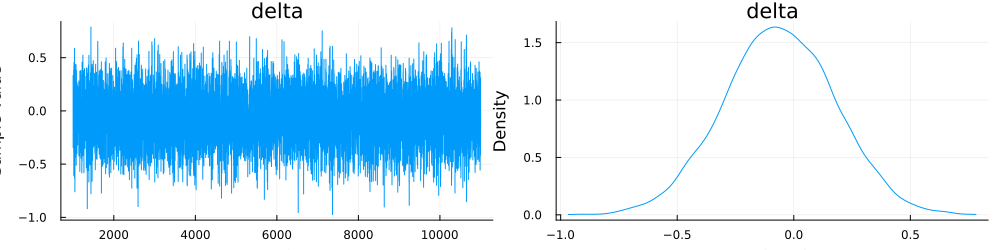

In [22]:
plot(chain[[:delta]], fmt=format)

In [23]:
function plot_comparing_between_subject_proportions(chain, prior_dist, zoom, size=(600, 400))
    delta = chain[:delta] |> vec
    plot(zoom, [pdf(prior_dist, e) for e in zoom], size=size, fmt=format, linewidth=2, label="Prior")
    k = kde(delta)
    plot!(zoom, pdf(k, zoom), linewidth=2, ls=:dash, label="Posterior")
    plot!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], linewidth=2, label=false)
    println(pdf(k, 0) / pdf(prior_dist, 0))
    scatter!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], label=false)
    bayes_factor = pdf(k, 0) / pdf(prior_dist, 0)
    println("Bayes Factor $bayes_factor")
    xlabel!("Delta")
    ylabel!("Density")
    xlims!(min(zoom...), max(zoom...))
end

plot_comparing_between_subject_proportions (generic function with 2 methods)

3.920024719768321
Bayes Factor 3.920024719768321


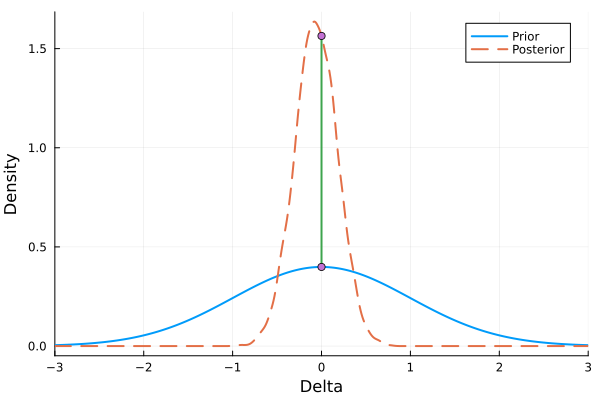

In [24]:
plot_comparing_between_subject_proportions(chain, 
    Normal(0,1), -3:0.01:3)

## 9.5 Order-restricted between-subject proportions


$$ \delta \sim \text{Gaussian}(0,1)_{\mathcal I(0,∞)}$$
$$ \mu \sim \text{Gaussian}(0,1)$$
$$ \sigma \sim \text{Uniform}(0,10)$$
$$ \alpha = \delta\sigma$$
  
$$ \phi^c_{i} \sim \text{Gaussian}(\mu\,+\alpha/2,1/\sigma^2)$$
$$ \phi^a_{j} \sim \text{Gaussian}(\mu\,-\alpha/2,1/\sigma^2)$$
  
$$ \theta^c_{i} = \Phi(\phi^c_{i})$$
$$ \theta^a_{j} = \Phi(\phi^a_{j})$$
  
$$ s^c_{i} \sim \text{Binomial}(\theta^c_{i},n^c_{i})$$
$$ s^a_{j} \sim \text{Binomial}(\theta^a_{j},n^a_{j})$$

In [25]:
# fmt: off
### Geurts data:
# Normal Controls:
numerrors1 = [
    15, 10, 61, 11, 60, 44, 63, 70, 57, 11, 67, 21, 89, 12, 63, 11, 96, 10, 37, 19, 44,
    18, 78, 27, 60, 14
]
nc = [
    89, 74, 128, 87, 128, 121, 128, 128, 128, 78, 128, 106, 128, 83, 128, 100, 128,
    73, 128, 86, 128, 86, 128, 100, 128, 79
]

kc = nc - numerrors1
nsc = length(kc)
# ADHD:
numerrors2 = [
    88, 50, 58, 17, 40, 18, 21, 50, 21, 69, 19, 29, 11, 76, 46, 36, 37, 72, 27, 92, 13,
    39, 53, 31, 49, 57, 17, 10, 12, 21, 39, 43, 49, 17, 39, 13, 68, 24, 21, 27, 48, 54,
    41, 75, 38, 76, 21, 41, 61, 24, 28, 21
]
na = [
    128, 128, 128, 86, 128, 117, 89, 128, 110, 128, 93, 107, 87, 128, 128, 113, 128,
    128, 98, 128, 93, 116, 128, 116, 128, 128, 93, 86, 86, 96, 128, 128, 128, 86, 128,
    78, 128, 111, 100, 95, 128, 128, 128, 128, 128, 128, 98, 127, 128, 93, 110, 96
]
ka = na - numerrors2
nsa = length(ka)

52

In [26]:
phi(x) = cdf(Normal(0, 1), x)

@model function OrderRestrictedBetweenSubjectProportions(ka, na, kc, nc)
    mu ~ Normal(0, 1)
    sigma ~ Uniform(0, 10)
    delta ~ truncated(Normal(0, 1), lower=0)

    alpha = delta * sigma

    phi_c ~ filldist(Normal(mu + alpha / 2, sigma), length(kc))
    phi_a ~ filldist(Normal(mu - alpha / 2, sigma), length(ka))

    theta_c = phi.(phi_c)
    theta_a = phi.(phi_a)

    for i in eachindex(kc)
        kc[i] ~ Binomial(nc[i], theta_c[i])
    end

    for i in eachindex(ka)
        ka[i] ~ Binomial(na[i], theta_a[i])
    end

    return (theta_c=theta_c, theta_a=theta_a)
end


iterations = 10_000
burnin = 5_000

model_order_restricted_between_subject_proportions = OrderRestrictedBetweenSubjectProportions(ka, na, kc, nc)
chain = sample(model_order_restricted_between_subject_proportions, NUTS(), iterations, burnin=burnin)
chains_params = Turing.MCMCChains.get_sections(chain, :parameters)
quantities = generated_quantities(model_order_restricted_between_subject_proportions, chains_params)
chain

┌ Info: Found initial step size
└   ϵ = 0.4
Sampling: 100%|█████████████████████████████████████████| Time: 0:00:13


Chains MCMC chain (10000×93×1 Array{Float64, 3}):

Iterations        = 1001:1:11000
Number of chains  = 1
Samples per chain = 10000
Wall duration     = 18.97 seconds
Compute duration  = 18.97 seconds
parameters        = mu, sigma, delta, phi_c[1], phi_c[2], phi_c[3], phi_c[4], phi_c[5], phi_c[6], phi_c[7], phi_c[8], phi_c[9], phi_c[10], phi_c[11], phi_c[12], phi_c[13], phi_c[14], phi_c[15], phi_c[16], phi_c[17], phi_c[18], phi_c[19], phi_c[20], phi_c[21], phi_c[22], phi_c[23], phi_c[24], phi_c[25], phi_c[26], phi_a[1], phi_a[2], phi_a[3], phi_a[4], phi_a[5], phi_a[6], phi_a[7], phi_a[8], phi_a[9], phi_a[10], phi_a[11], phi_a[12], phi_a[13], phi_a[14], phi_a[15], phi_a[16], phi_a[17], phi_a[18], phi_a[19], phi_a[20], phi_a[21], phi_a[22], phi_a[23], phi_a[24], phi_a[25], phi_a[26], phi_a[27], phi_a[28], phi_a[29], phi_a[30], phi_a[31], phi_a[32], phi_a[33], phi_a[34], phi_a[35], phi_a[36], phi_a[37], phi_a[38], phi_a[39], phi_a[40], phi_a[41], phi_a[42], phi_a[43], phi_a[44], phi_a[45],

In [27]:
function plot_order_restricted_between_subject_proportions(chain, prior_dist, zoom, size=(600, 400))
    delta = chain[:delta] |> vec
    plot(zoom, [pdf(prior_dist, e) for e in zoom], size=size, fmt=format, linewidth=2, label="Prior")
    k = kde(delta)
    plot!(zoom, pdf(k, zoom), linewidth=2, ls=:dash, label="Posterior")
    plot!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], linewidth=2, label=false)
    println(pdf(k, 0) / pdf(prior_dist, 0))
    scatter!([0, 0], [pdf(prior_dist, 0), pdf(k, 0)], label=false)
    bayes_factor = pdf(k, 0) / pdf(prior_dist, 0)
    println("Bayes Factor $bayes_factor")
    xlabel!("Delta")
    ylabel!("Density")
    xlims!(min(zoom...), max(zoom...))
end

plot_order_restricted_between_subject_proportions (generic function with 2 methods)

2.3933158091453777
Bayes Factor 2.3933158091453777


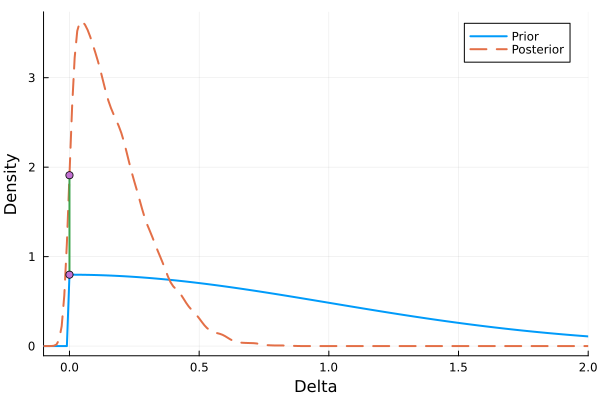

In [28]:
plot_order_restricted_between_subject_proportions(chain,
    truncated(Normal(0, 1), lower=0), -0.1:0.01:2)

In [29]:
Pkg.status()

Status `~/quangtiencs_projects/bayesian-cognitive-modeling-with-turing.jl/Project.toml`
  [336ed68f] CSV v0.10.11
  [a93c6f00] DataFrames v1.6.1
  [39dd38d3] Dierckx v0.5.3
⌃ [366bfd00] DynamicPPL v0.23.0
  [1a297f60] FillArrays v1.5.0
  [7073ff75] IJulia v1.24.2
  [a98d9a8b] Interpolations v0.14.7
  [5ab0869b] KernelDensity v0.6.7
  [b964fa9f] LaTeXStrings v1.3.0
  [2ab3a3ac] LogExpFunctions v0.3.24
  [91a5bcdd] Plots v1.38.17
  [37e2e3b7] ReverseDiff v1.15.0
  [276daf66] SpecialFunctions v2.3.0
  [2913bbd2] StatsBase v0.34.0
  [f3b207a7] StatsPlots v0.15.6
  [fce5fe82] Turing v0.28.1
  [e88e6eb3] Zygote v0.6.62
Info Packages marked with ⌃ have new versions available and may be upgradable.
